# Sana diffusion trajectory notebook: from pure noise to image video

This notebook generates an image with a **recent top-conference diffusion model** and records the intermediate denoising trajectory as PNG frames, an animated GIF, and an MP4 video.

**Model used:** **Sana** (`Efficient-Large-Model/Sana_600M_512px_diffusers`), a recent text-to-image diffusion model from **ICLR 2025**.  
This notebook uses the official **Diffusers** `SanaPipeline`, which makes it easy to capture intermediate latent states during sampling.

## What you will get
- a final generated image
- a folder of intermediate frames
- a contact sheet of the denoising trajectory
- an MP4 video and a GIF that show the evolution from noise to the final image

## Practical notes
- A **CUDA GPU is strongly recommended**.
- The default model is the lighter **600M / 512px** Sana variant for classroom practicality.
- You can later switch to `Efficient-Large-Model/Sana_600M_1024px_diffusers` or a 1600M variant if you want higher resolution.

## **IMPORTANT NOTE**
In Colab, go to `Runtime` -> `Change runtime type` -> `GPU`

In [1]:
# Install dependencies
%pip install -q -U diffusers transformers accelerate sentencepiece safetensors imageio imageio-ffmpeg matplotlib "pillow<12"

In [2]:
import os
import math
import shutil
from pathlib import Path

import imageio.v2 as imageio
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image, ImageDraw

from diffusers import SanaPipeline
from IPython.display import display, Video

torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

print("Torch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print("BF16 supported:", torch.cuda.is_bf16_supported())

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Torch version: 2.10.0+cu128
CUDA available: True
GPU: Tesla T4
BF16 supported: True


In [3]:
# Optional Colab diagnostics / workaround info
import os

print("Python:", os.sys.version.split()[0])
print("Torch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print("BF16 supported:", torch.cuda.is_bf16_supported())

print("\nIf you are on a T4 and see a VAE decode error, keep the VAE/text encoder in float32.")


Python: 3.12.13
Torch: 2.10.0+cu128
CUDA available: True
GPU: Tesla T4
BF16 supported: True

If you are on a T4 and see a VAE decode error, keep the VAE/text encoder in float32.


### Colab note

If you are using a **T4** or another GPU without native BF16 support, keep:
- the **transformer** in `torch.float16`,
- the **text encoder** in `torch.float32`,
- the **VAE** in `torch.float32`.

This follows the official Sana/Diffusers guidance that the VAE and text encoder should stay in `bfloat16` or `float32`.


## Configuration

Edit the prompt, seed, and output settings below.

The default choice uses the official **Sana 600M / 512px diffusers checkpoint**, which is much more manageable for a course demo than larger text-to-image models while still being a modern diffusion model.

In [4]:
# ----------------------------
# User-facing configuration
# ----------------------------
MODEL_ID = "Efficient-Large-Model/Sana_600M_512px_diffusers"
PROMPT = "A watercolor illustration of a curious robot studying probability and uncertainty in a quiet university classroom, soft morning light, highly detailed"
# PROMPT = "A curious robot studying machine learning and uncertainty in a quiet university classroom in Ottawa, highly detailed"
NEGATIVE_PROMPT = "blurry, low quality, distorted, extra fingers, watermark, text"

HEIGHT = 512
WIDTH = 512
NUM_INFERENCE_STEPS = 20
GUIDANCE_SCALE = 4.5
SEED = 0

# Capture every denoising step. Set to 2 or 4 if you want fewer frames.
CAPTURE_EVERY = 1

# Video / GIF settings
FPS = 6
HOLD_FIRST_FRAMES = 8
HOLD_LAST_FRAMES = 12

# Output directory
OUT_DIR = Path("sana_diffusion_trajectory")
FRAMES_DIR = OUT_DIR / "frames"
OUT_DIR.mkdir(exist_ok=True)
FRAMES_DIR.mkdir(exist_ok=True)

print("Outputs will be written to:", OUT_DIR.resolve())

Outputs will be written to: /content/sana_diffusion_trajectory


In [5]:
# Optional cleanup if you want a fresh run each time.
for p in FRAMES_DIR.glob("*.png"):
    p.unlink()

for fname in ["trajectory.gif", "trajectory.mp4", "contact_sheet.png", "final_image.png"]:
    fpath = OUT_DIR / fname
    if fpath.exists():
        fpath.unlink()

print("Cleaned previous outputs.")

Cleaned previous outputs.


## Load the Sana pipeline

This notebook keeps the main transformer in FP16 and uses BF16 for the text encoder / VAE when supported, following the official model card guidance as closely as practical.

In [6]:
if not torch.cuda.is_available():
    raise RuntimeError(
        "This notebook is intended for a CUDA GPU. "
        "The Sana demo is usually too slow or impractical on CPU."
    )

device = "cuda"
main_dtype = torch.float16

# Important for Sana:
# - keep the denoising transformer on GPU for speed,
# - keep the text encoder in bf16 if available, otherwise fp32,
# - decode latents with the VAE on CPU in fp32 to avoid Colab/cuDNN conv issues.
safe_text_dtype = torch.bfloat16 if torch.cuda.is_bf16_supported() else torch.float32

pipe = SanaPipeline.from_pretrained(
    MODEL_ID,
    variant="fp16",
    torch_dtype=main_dtype,
)

pipe = pipe.to(device)
pipe.transformer.to(device=device, dtype=main_dtype)
pipe.text_encoder.to(device=device, dtype=safe_text_dtype)

# Robust Colab workaround:
# keep the VAE on CPU and decode in float32.
pipe.vae.to(device="cpu", dtype=torch.float32)

# Memory helpers
if hasattr(pipe, "enable_vae_slicing"):
    pipe.enable_vae_slicing()
if hasattr(pipe, "enable_vae_tiling"):
    pipe.enable_vae_tiling()

def module_device(module):
    return next(module.parameters()).device

print("Pipeline loaded.")
print("Transformer dtype/device:", pipe.transformer.dtype, module_device(pipe.transformer))
print("Text encoder dtype/device:", pipe.text_encoder.dtype, module_device(pipe.text_encoder))
print("VAE dtype/device:", pipe.vae.dtype, module_device(pipe.vae))
print("VAE scale factor:", pipe.vae_scale_factor)
print("Latent channels:", pipe.transformer.config.in_channels)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/288 [00:00<?, ?it/s]

Pipeline loaded.
Transformer dtype/device: torch.float16 cuda:0
Text encoder dtype/device: torch.bfloat16 cuda:0
VAE dtype/device: torch.float32 cpu
VAE scale factor: 32
Latent channels: 32


/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/sana/pipeline_sana.py:229: FutureWarning: `enable_vae_slicing` is deprecated and will be removed in version 0.40.0. Calling `enable_vae_slicing()` on a `SanaPipeline` is deprecated and this method will be removed in a future version. Please use `pipe.vae.enable_slicing()`.
  deprecate(
/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/sana/pipeline_sana.py:256: FutureWarning: `enable_vae_tiling` is deprecated and will be removed in version 0.40.0. Calling `enable_vae_tiling()` on a `SanaPipeline` is deprecated and this method will be removed in a future version. Please use `pipe.vae.enable_tiling()`.
  deprecate(


In [7]:
@torch.no_grad()
def decode_latents_to_pil(pipe, latents):
    """Decode Sana latents into a PIL image using the VAE on CPU."""
    if latents.ndim == 3:
        latents = latents.unsqueeze(0)

    latents = latents[:1].to(device="cpu", dtype=torch.float32)

    scaling_factor = getattr(pipe.vae.config, "scaling_factor", 1.0)
    image = pipe.vae.decode(latents / scaling_factor, return_dict=False)[0]

    # Diffusers image processors convert the decoded tensor to [0, 1] and PIL format.
    pil = pipe.image_processor.postprocess(image, output_type="pil")[0]
    return pil


def annotate_frame(image, text):
    """Overlay a simple label on a PIL image."""
    img = image.convert("RGB").copy()
    draw = ImageDraw.Draw(img)

    # Simple translucent-ish box effect using solid fill.
    margin = 12
    box_h = 34
    draw.rectangle([margin, margin, img.width - margin, margin + box_h], fill=(0, 0, 0))
    draw.text((margin + 10, margin + 8), text, fill=(255, 255, 255))
    return img


def make_contact_sheet(images, cols=4, bg=(255, 255, 255)):
    """Create a simple contact sheet from PIL images."""
    if len(images) == 0:
        raise ValueError("No images were provided.")

    w, h = images[0].size
    rows = math.ceil(len(images) / cols)
    sheet = Image.new("RGB", (cols * w, rows * h), color=bg)

    for idx, img in enumerate(images):
        x = (idx % cols) * w
        y = (idx // cols) * h
        sheet.paste(img.convert("RGB"), (x, y))

    return sheet


def save_mp4(frames, path, fps=6):
    writer = imageio.get_writer(path, fps=fps, codec="libx264", quality=8)
    try:
        for frame in frames:
            writer.append_data(np.asarray(frame.convert("RGB")))
    finally:
        writer.close()


def build_video_frame_list(frames, hold_first=8, hold_last=12):
    video_frames = []
    if len(frames) == 0:
        return video_frames

    video_frames.extend([frames[0]] * hold_first)
    video_frames.extend(frames[1:-1])
    video_frames.extend([frames[-1]] * hold_last)
    return video_frames


## Generate one image and capture the denoising trajectory

The callback stores the latent tensor after each denoising step.  
We also manually store the **initial pure latent noise** before denoising starts, so the video begins from noise.

  0%|          | 0/20 [00:00<?, ?it/s]

Captured 21 latent states (including the initial noise frame).


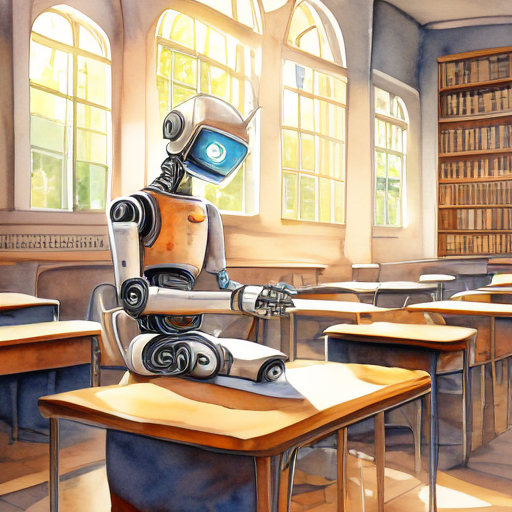

In [8]:
# Pre-sample the initial latent noise so that:
# 1) the first video frame corresponds to the same exact random start,
# 2) the trajectory is reproducible from the chosen seed.

latent_h = HEIGHT // pipe.vae_scale_factor
latent_w = WIDTH // pipe.vae_scale_factor
latent_channels = pipe.transformer.config.in_channels

generator = torch.Generator(device=device).manual_seed(SEED)
initial_latents = torch.randn(
    (1, latent_channels, latent_h, latent_w),
    generator=generator,
    device=device,
    dtype=torch.float32,
)

captured = [
    {
        "step": -1,
        "timestep": None,
        "latents": initial_latents.detach().cpu().clone(),
        "label": "initial latent noise",
    }
]

def capture_callback(pipe, step, timestep, callback_kwargs):
    if (step % CAPTURE_EVERY == 0) or (step == NUM_INFERENCE_STEPS - 1):
        captured.append(
            {
                "step": int(step),
                "timestep": int(timestep.item()) if torch.is_tensor(timestep) else int(timestep),
                "latents": callback_kwargs["latents"].detach().cpu().clone(),
                "label": f"step {step + 1}/{NUM_INFERENCE_STEPS}",
            }
        )
    return callback_kwargs

with torch.no_grad():
    result = pipe(
        prompt=PROMPT,
        negative_prompt=NEGATIVE_PROMPT,
        height=HEIGHT,
        width=WIDTH,
        guidance_scale=GUIDANCE_SCALE,
        num_inference_steps=NUM_INFERENCE_STEPS,
        latents=initial_latents.clone(),
        callback_on_step_end=capture_callback,
        callback_on_step_end_tensor_inputs=["latents"],
        output_type="latent",   # avoid final GPU VAE decode inside the pipeline
    )

final_latents = result.images
if isinstance(final_latents, (list, tuple)):
    final_latents = final_latents[0]
final_image = decode_latents_to_pil(pipe, final_latents)
final_image.save(OUT_DIR / "final_image.png")

print(f"Captured {len(captured)} latent states (including the initial noise frame).")
display(final_image)


## Decode the captured latent states into image frames

Each stored latent state is decoded back to image space, annotated, and saved as a PNG.

Saved 21 PNG frames to /content/sana_diffusion_trajectory/frames


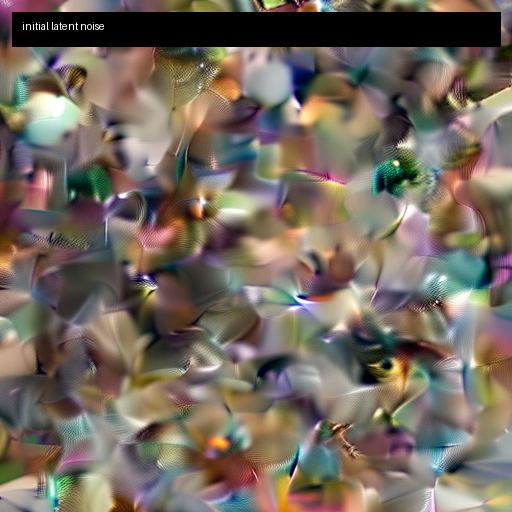

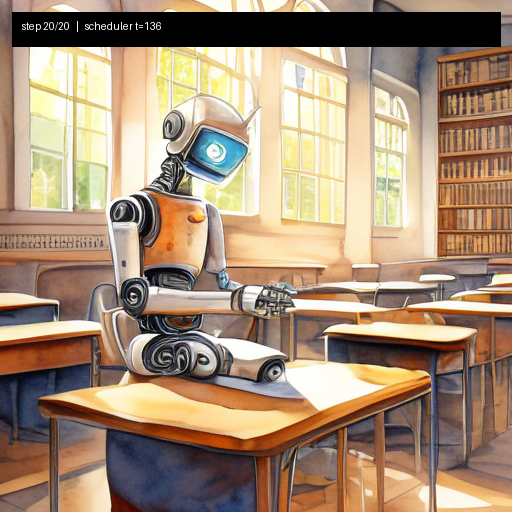

In [9]:
decoded_frames = []
frame_paths = []

for idx, item in enumerate(captured):
    pil = decode_latents_to_pil(pipe, item["latents"])
    label = item["label"]
    if item["timestep"] is not None:
        label += f"   |   scheduler t={item['timestep']}"
    pil = annotate_frame(pil, label)

    frame_path = FRAMES_DIR / f"frame_{idx:03d}.png"
    pil.save(frame_path)

    decoded_frames.append(pil)
    frame_paths.append(frame_path)

print(f"Saved {len(decoded_frames)} PNG frames to {FRAMES_DIR.resolve()}")
display(decoded_frames[0])
display(decoded_frames[-1])


## Save a contact sheet, GIF, and MP4

The first frame is held a little longer so the viewer can clearly see the pure-noise start.

In [10]:
contact_sheet = make_contact_sheet(decoded_frames, cols=4)
contact_sheet.save(OUT_DIR / "contact_sheet.png")

video_frames = build_video_frame_list(
    decoded_frames,
    hold_first=HOLD_FIRST_FRAMES,
    hold_last=HOLD_LAST_FRAMES,
)

gif_path = OUT_DIR / "trajectory.gif"
mp4_path = OUT_DIR / "trajectory.mp4"

imageio.mimsave(gif_path, [np.asarray(fr.convert("RGB")) for fr in video_frames], fps=FPS)
save_mp4(video_frames, mp4_path, fps=FPS)

print("Saved:")
print(" -", (OUT_DIR / "contact_sheet.png").resolve())
print(" -", gif_path.resolve())
print(" -", mp4_path.resolve())

Saved:
 - /content/sana_diffusion_trajectory/contact_sheet.png
 - /content/sana_diffusion_trajectory/trajectory.gif
 - /content/sana_diffusion_trajectory/trajectory.mp4


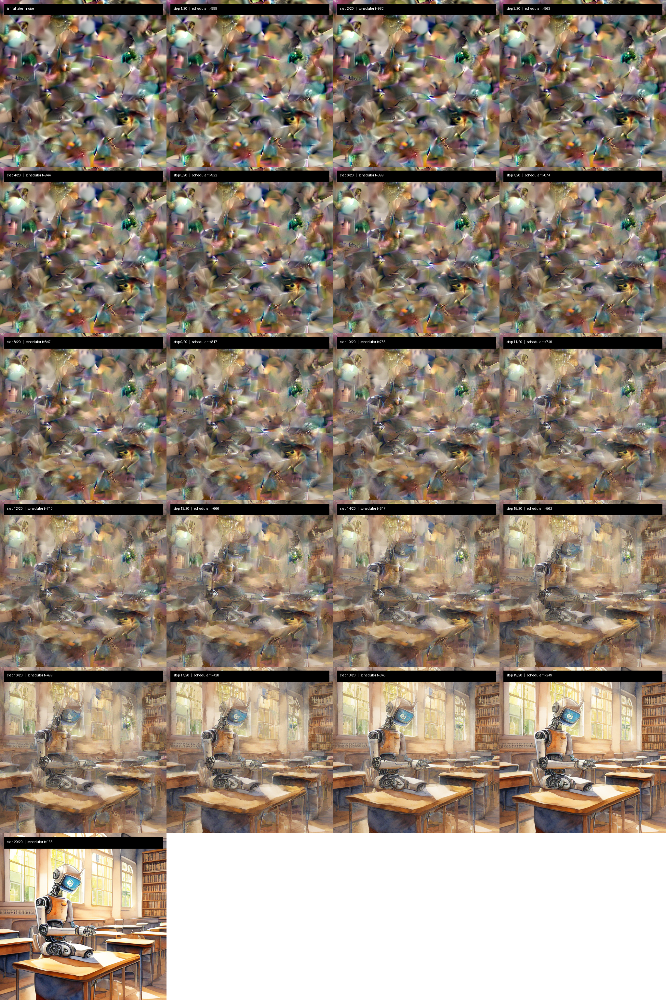

In [11]:
display(contact_sheet)
Video(str(mp4_path), embed=True)

## Files produced

After a successful run, the notebook creates:

- `final_image.png`
- `contact_sheet.png`
- `trajectory.gif`
- `trajectory.mp4`
- `frames/frame_000.png`, `frames/frame_001.png`, ...

## Good classroom variations
- change the `PROMPT`
- change the random `SEED`
- compare `NUM_INFERENCE_STEPS = 10, 20, 30`
- set `CAPTURE_EVERY = 2` to make a shorter, cleaner video
- switch from the 512px checkpoint to the 1024px Sana checkpoint

## Optional: inspect the saved files from Python

Run the next cell if you want a quick directory listing.

In [12]:
for path in sorted(OUT_DIR.rglob("*")):
    if path.is_file():
        print(path)

sana_diffusion_trajectory/contact_sheet.png
sana_diffusion_trajectory/final_image.png
sana_diffusion_trajectory/frames/frame_000.png
sana_diffusion_trajectory/frames/frame_001.png
sana_diffusion_trajectory/frames/frame_002.png
sana_diffusion_trajectory/frames/frame_003.png
sana_diffusion_trajectory/frames/frame_004.png
sana_diffusion_trajectory/frames/frame_005.png
sana_diffusion_trajectory/frames/frame_006.png
sana_diffusion_trajectory/frames/frame_007.png
sana_diffusion_trajectory/frames/frame_008.png
sana_diffusion_trajectory/frames/frame_009.png
sana_diffusion_trajectory/frames/frame_010.png
sana_diffusion_trajectory/frames/frame_011.png
sana_diffusion_trajectory/frames/frame_012.png
sana_diffusion_trajectory/frames/frame_013.png
sana_diffusion_trajectory/frames/frame_014.png
sana_diffusion_trajectory/frames/frame_015.png
sana_diffusion_trajectory/frames/frame_016.png
sana_diffusion_trajectory/frames/frame_017.png
sana_diffusion_trajectory/frames/frame_018.png
sana_diffusion_trajec

## Reference note

This notebook is built around the **Sana** family of text-to-image diffusion models and the official **Diffusers** `SanaPipeline`.  
For research extensions, the official Sana project also provides additional samplers and model variants beyond the simple notebook workflow used here.